Alleyah Pauline C. Manalili

# Support Vector Machines 
## Instructions
1. Use any dataset from https://archive.ics.uci.edu/datasets?Task=Clustering&skip=0&take=10&sort=desc&orderBy=NumHits&search=&Area=Biology
2. Each student should have a unique dataset otherwise no points will be given, so you need to discuss with your classmate.

Chosen Dataset: https://archive.ics.uci.edu/dataset/544/estimation+of+obesity+levels+based+on+eating+habits+and+physical+condition

**TASK: Take 10 moderately sized subsamples your dataset and create a correlation plot for each subsample**

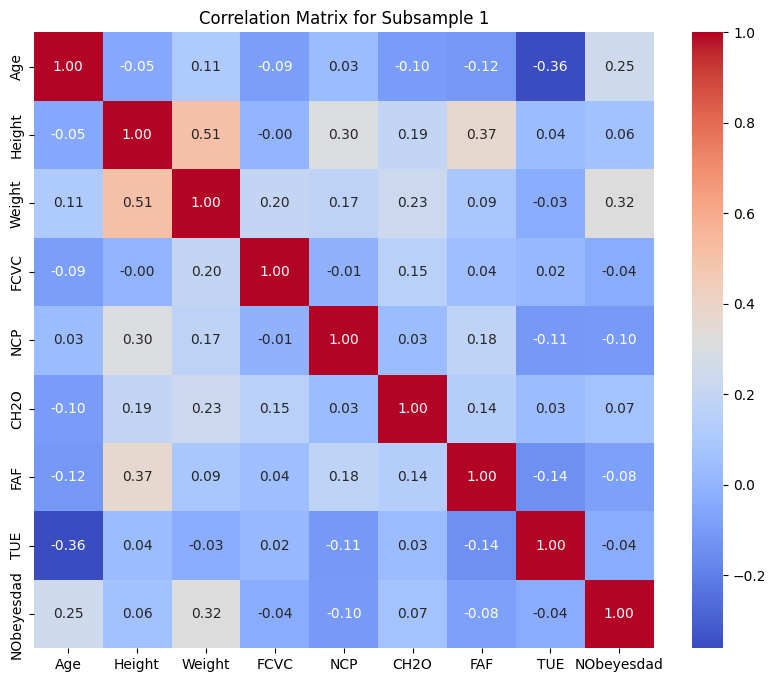

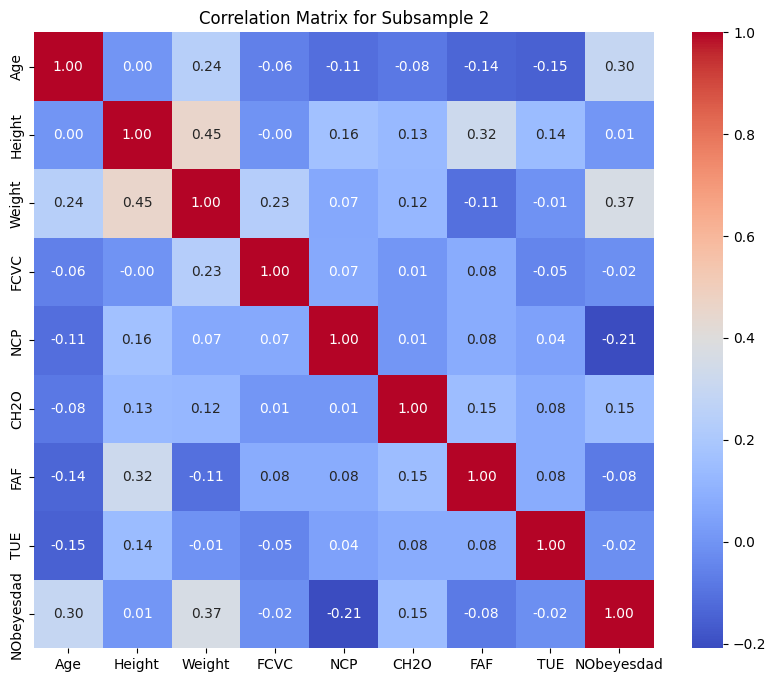

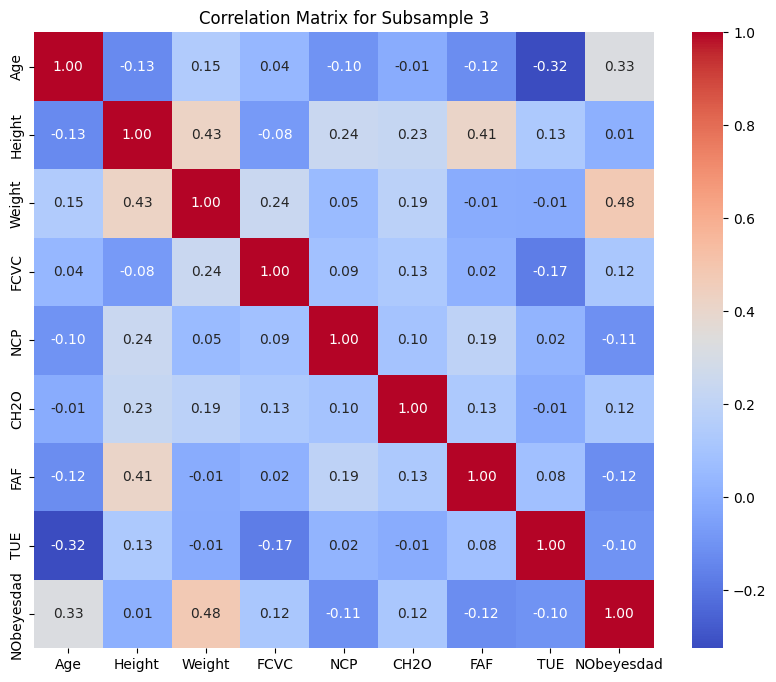

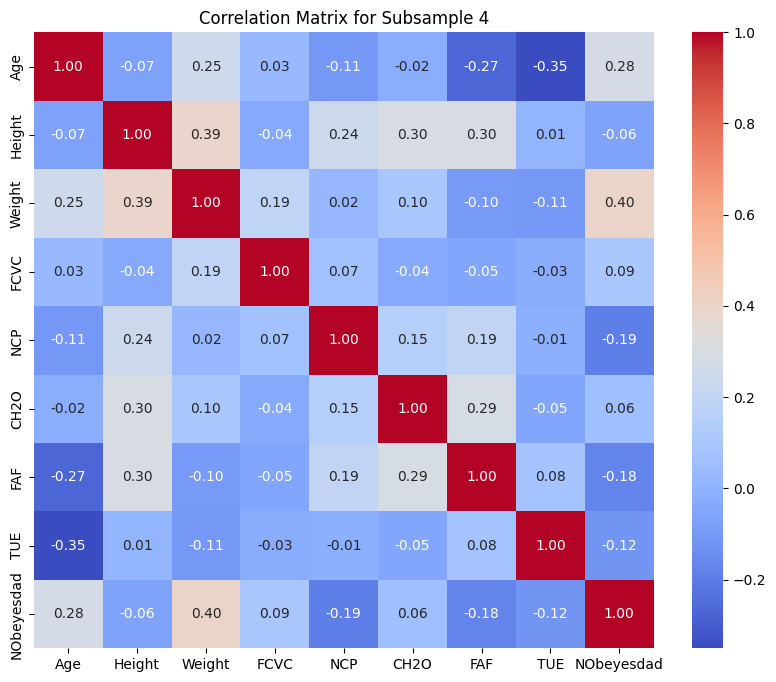

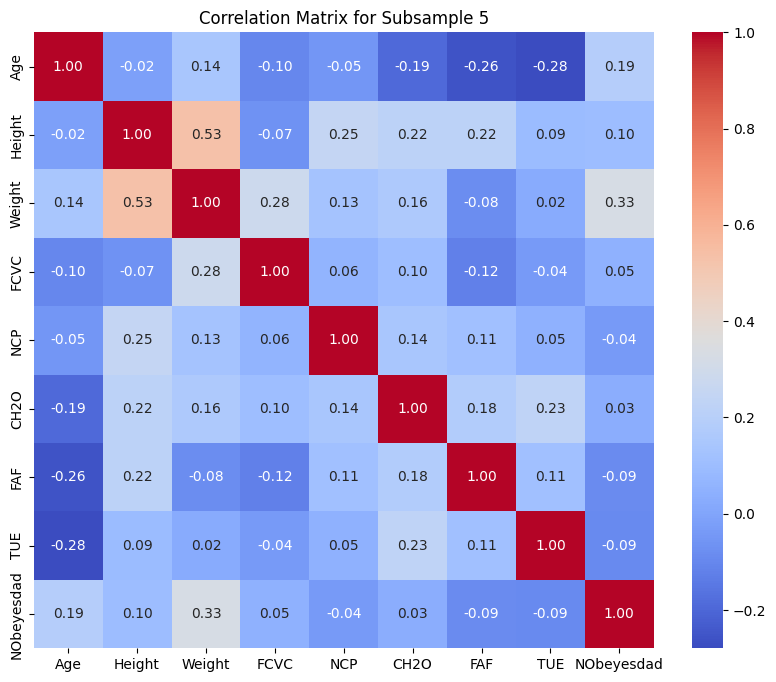

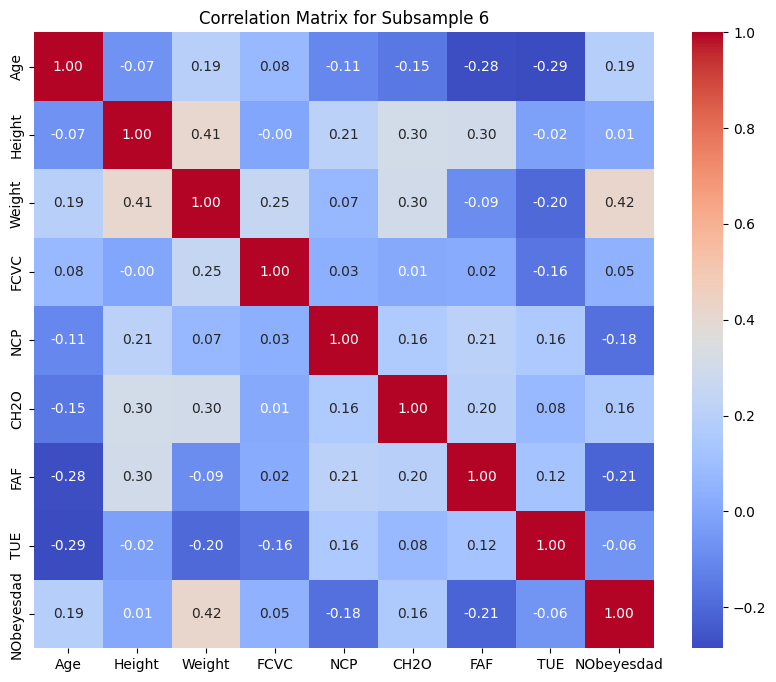

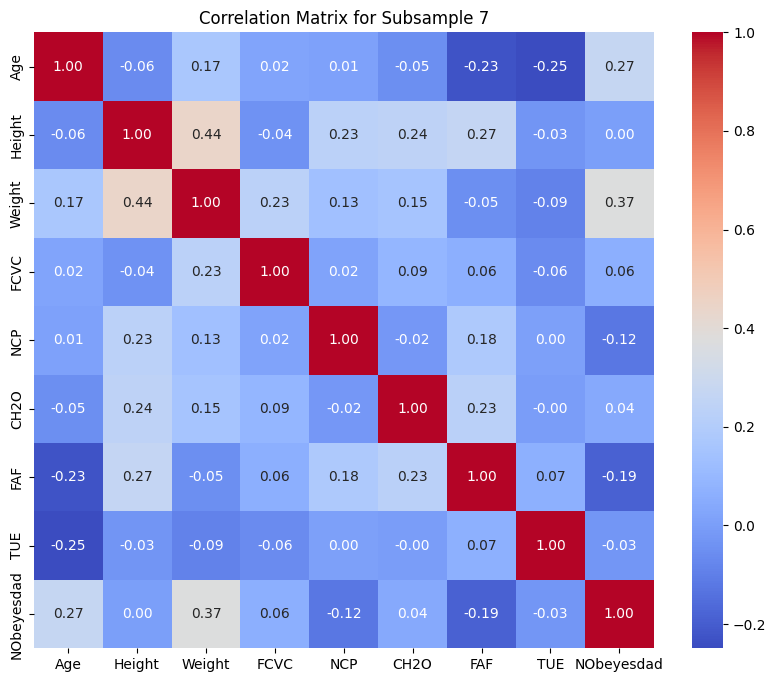

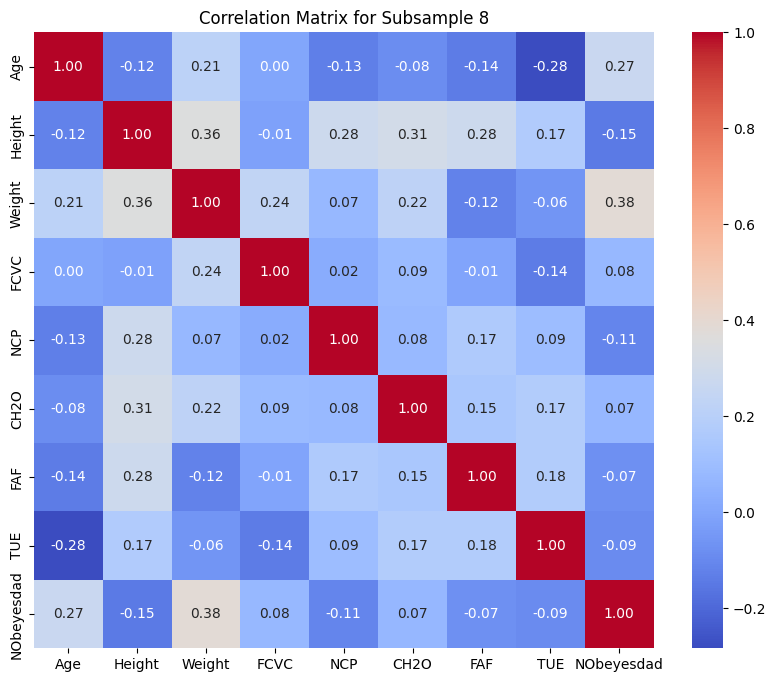

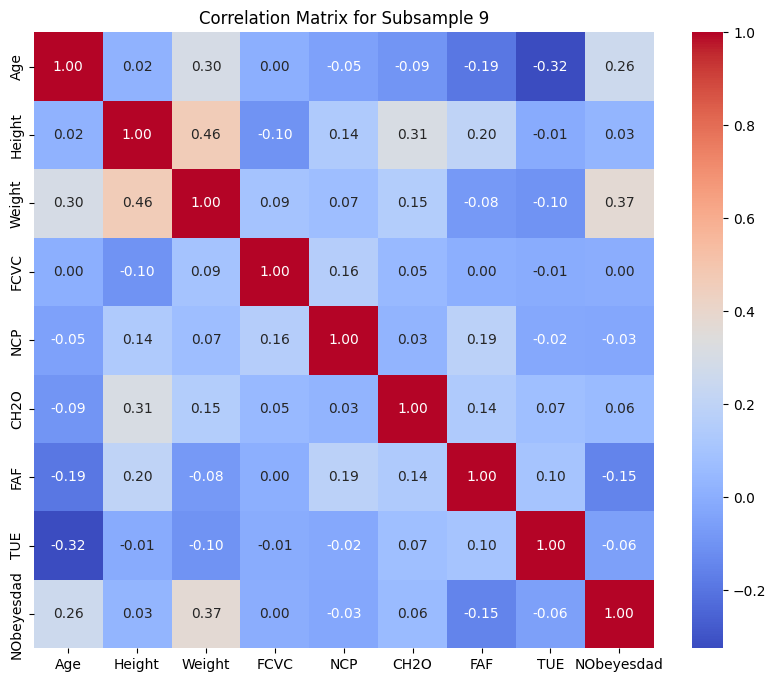

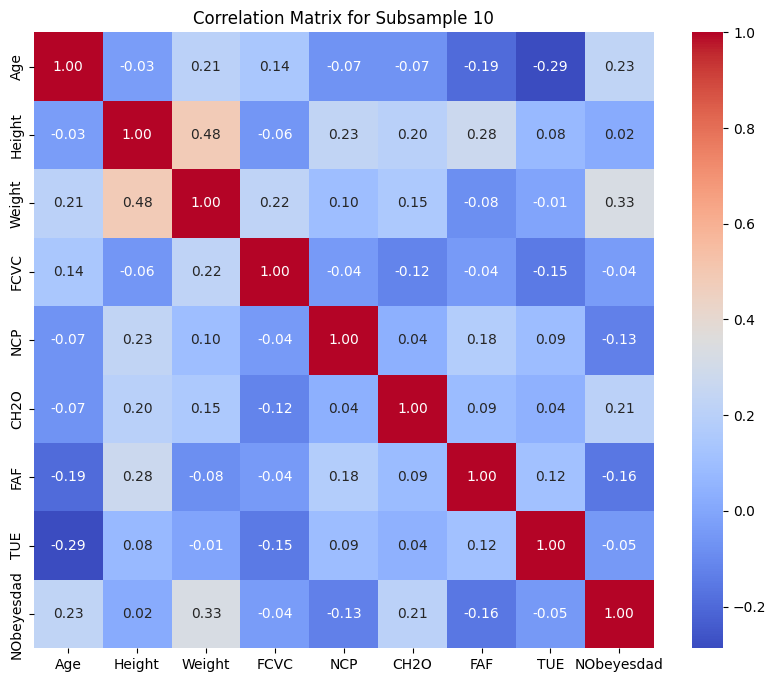

In [25]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

file_path = 'ObesityDataSet_raw_and_data_sinthetic.csv'
df = pd.read_csv(file_path)

target_variable = 'NObeyesdad'

if df[target_variable].dtype == 'object':
    le = LabelEncoder()
    df[target_variable] = le.fit_transform(df[target_variable])

num_subsamples = 10
subsample_size = int(len(df) * 0.1) 

for i in range(num_subsamples):
    subsample = df.sample(n=subsample_size, random_state=i) 

    numeric_subsample = subsample.select_dtypes(include=[np.number])
    
    correlation_matrix = numeric_subsample.corr()
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
    plt.title(f'Correlation Matrix for Subsample {i + 1}')
    plt.show()

**TASK (Classification): If your problem is a classification problem visually check if the target variable is imbalanced**</br>
N/A **TASK (Regression): If your problem is a regression problem visually the distribution of your target variabe**

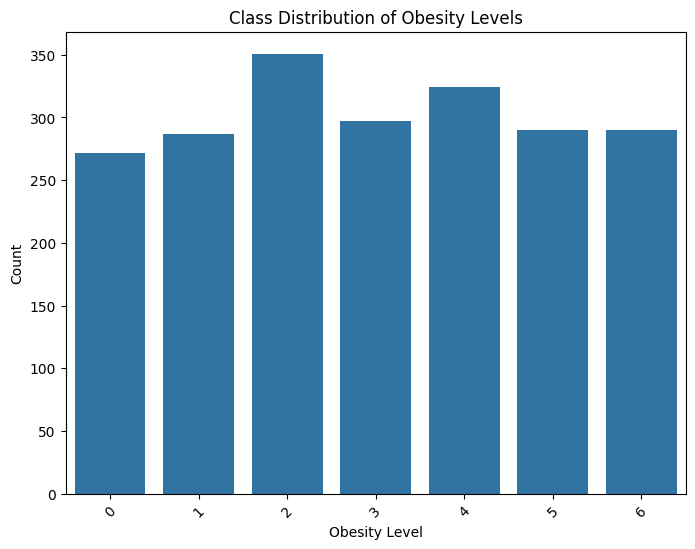

In [26]:
# Plot class distribution
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='NObeyesdad')
plt.title('Class Distribution of Obesity Levels')
plt.xlabel('Obesity Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

**TASK: Take 10 moderately sized subsamples and create a pairplot of the feature variable in relation to the target variable**

<Figure size 1200x800 with 0 Axes>

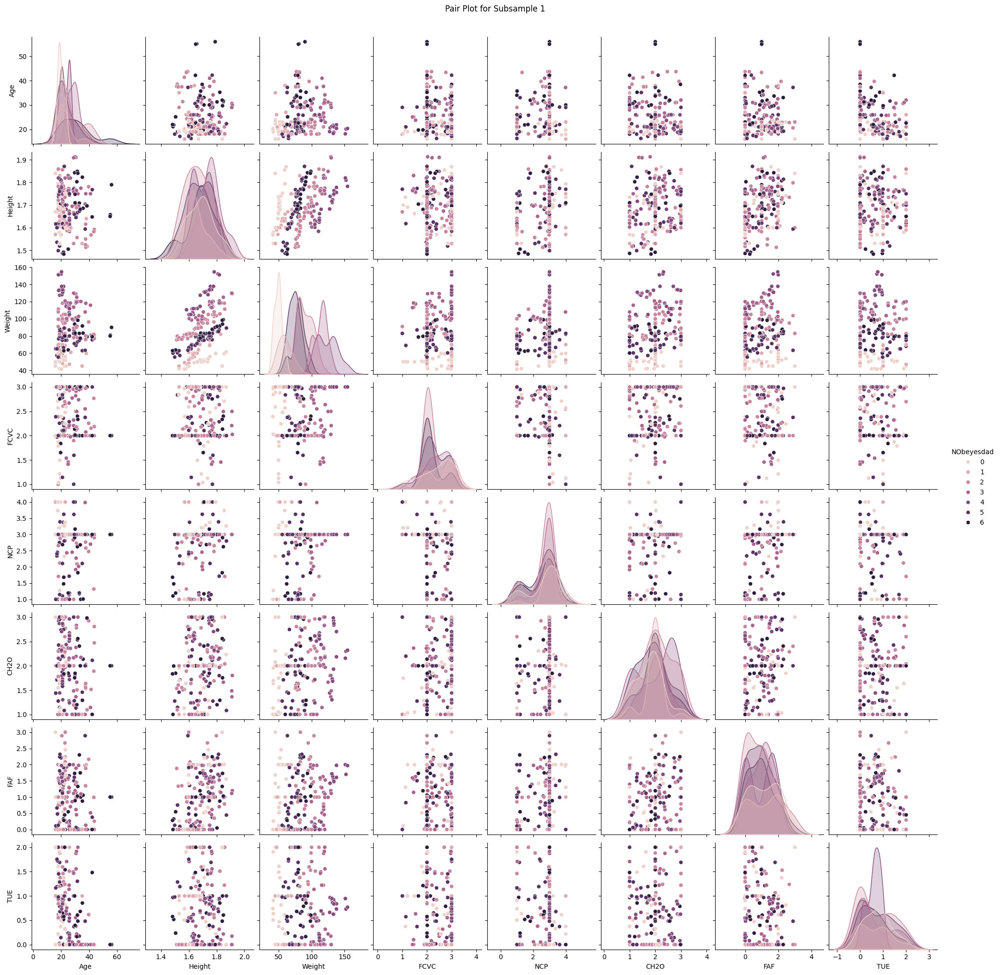

<Figure size 1200x800 with 0 Axes>

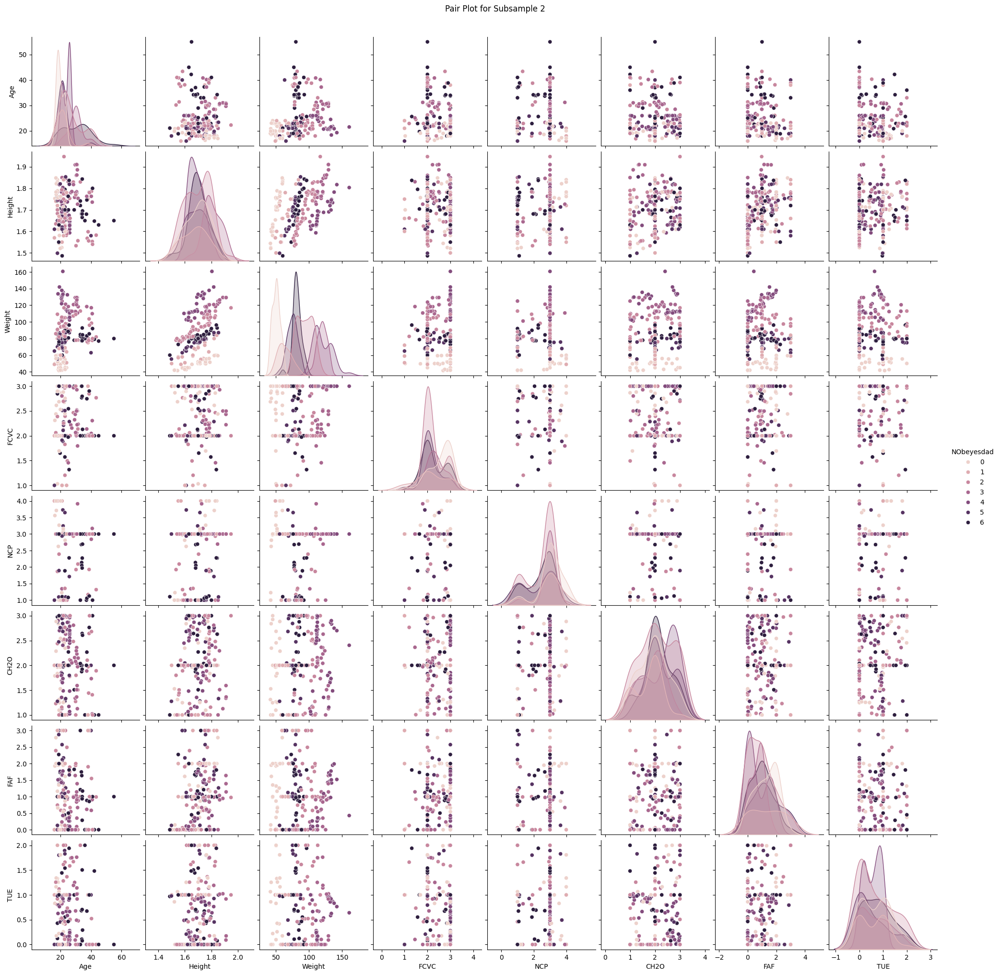

<Figure size 1200x800 with 0 Axes>

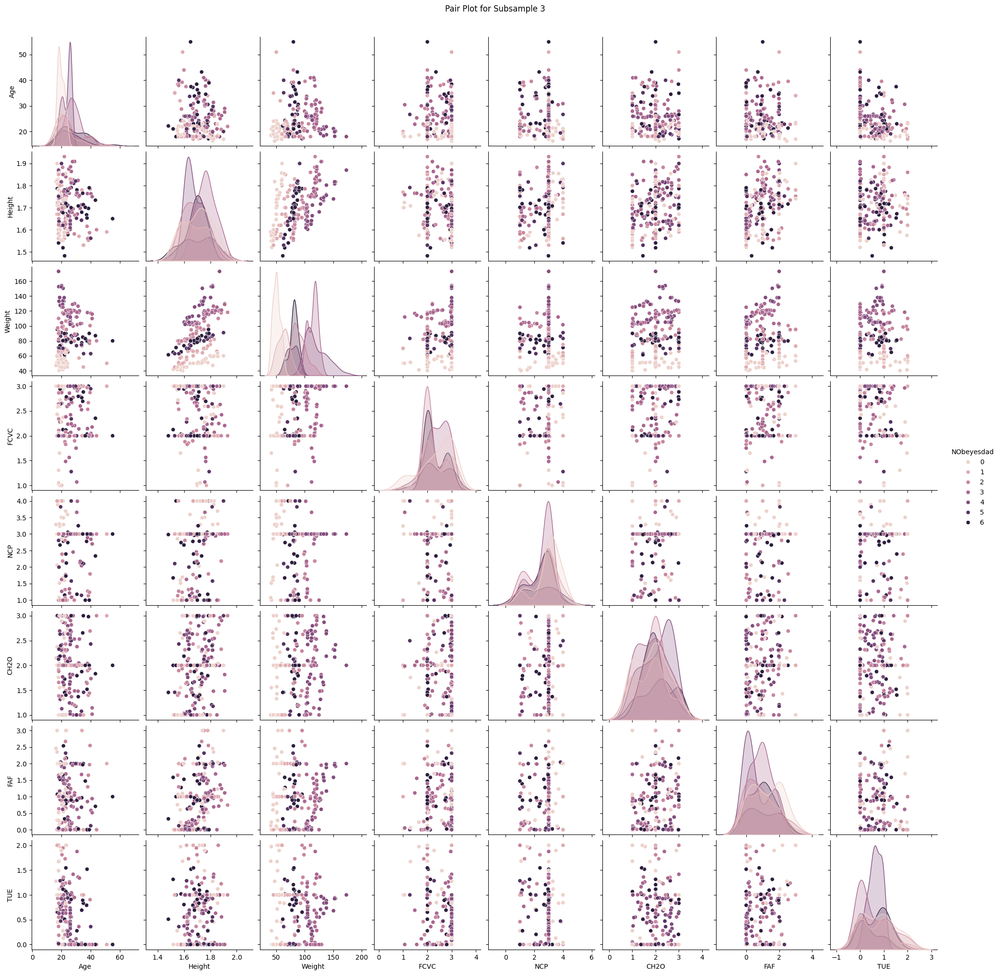

<Figure size 1200x800 with 0 Axes>

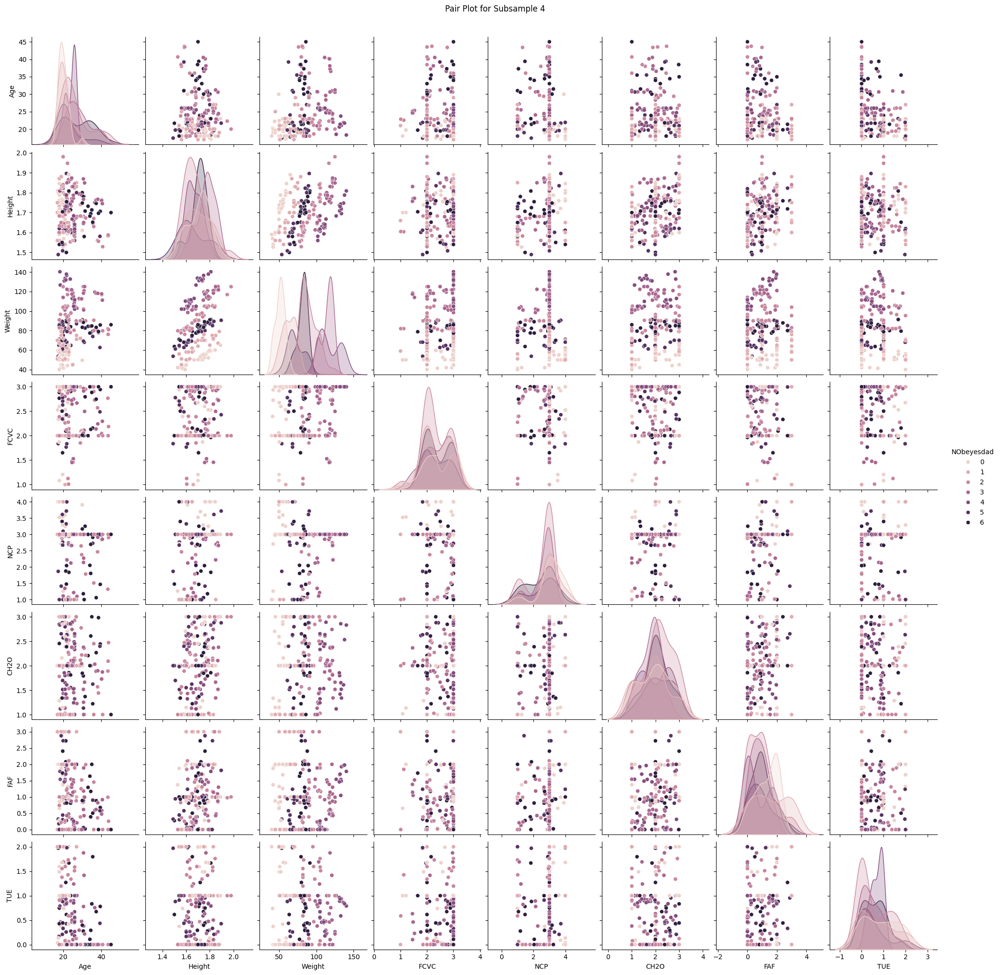

<Figure size 1200x800 with 0 Axes>

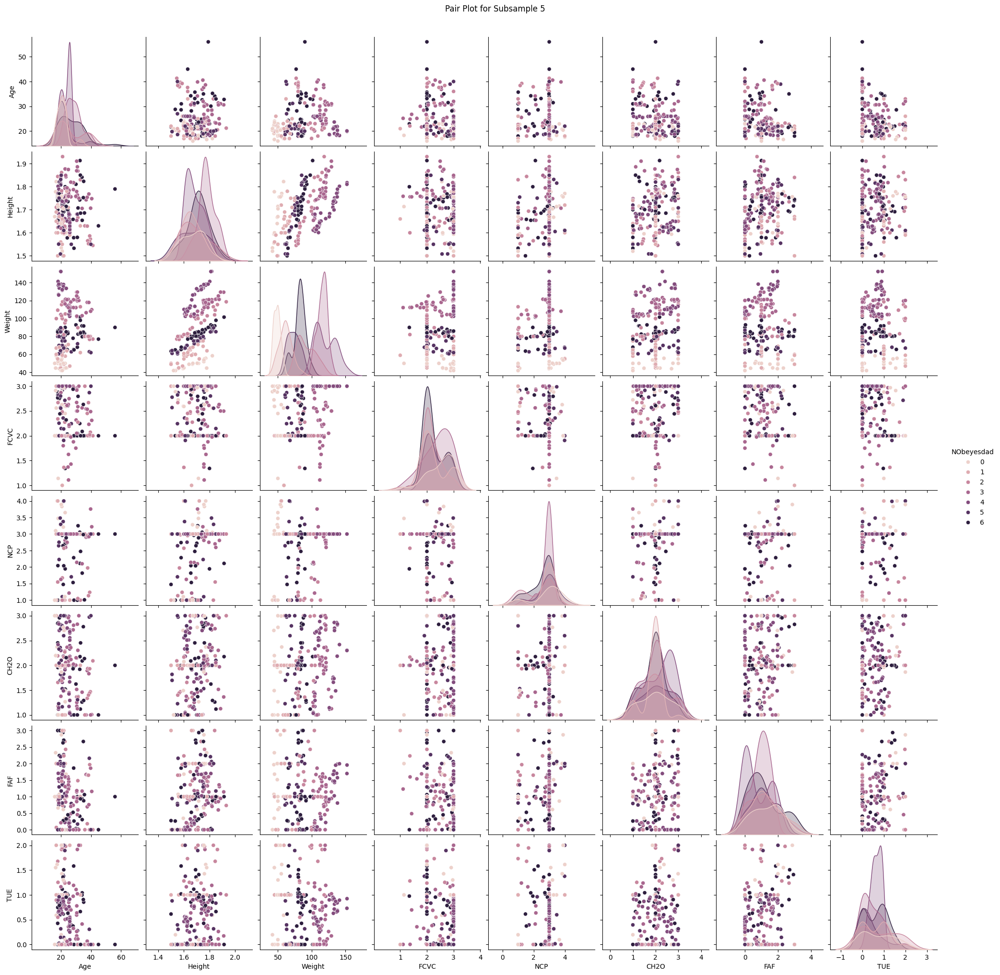

<Figure size 1200x800 with 0 Axes>

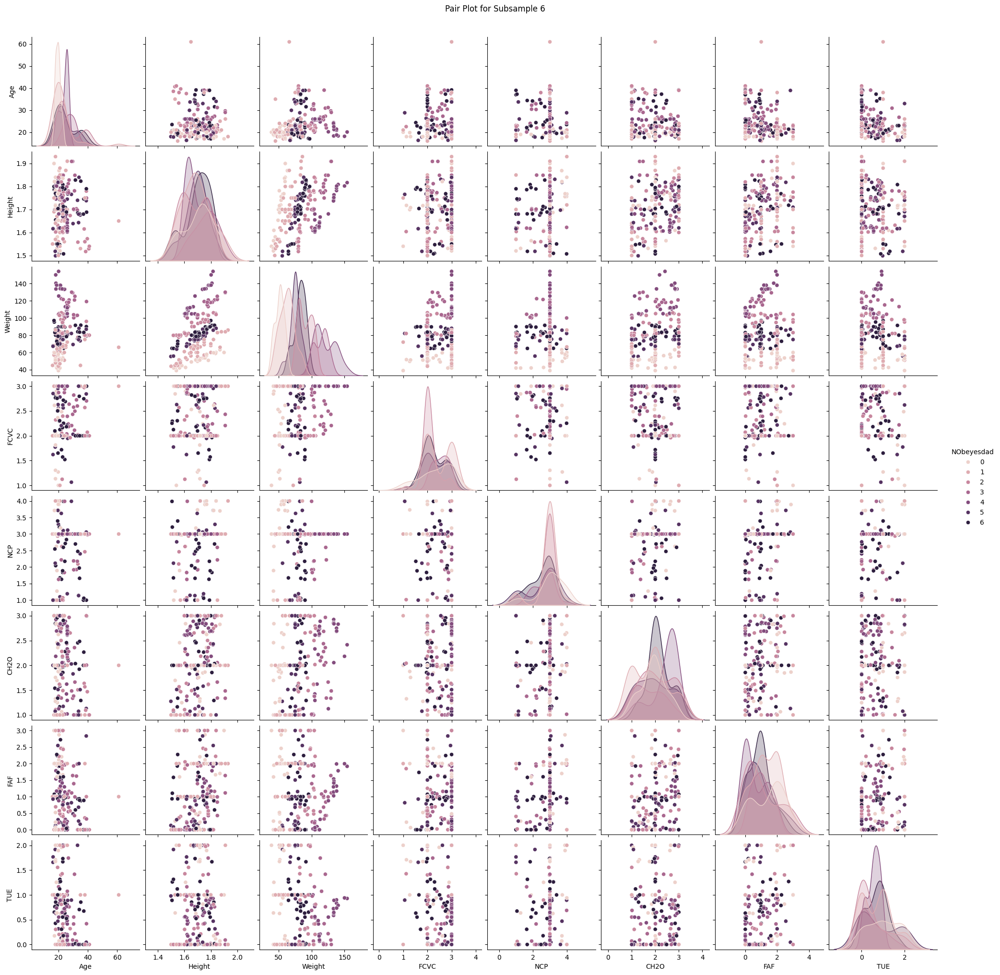

<Figure size 1200x800 with 0 Axes>

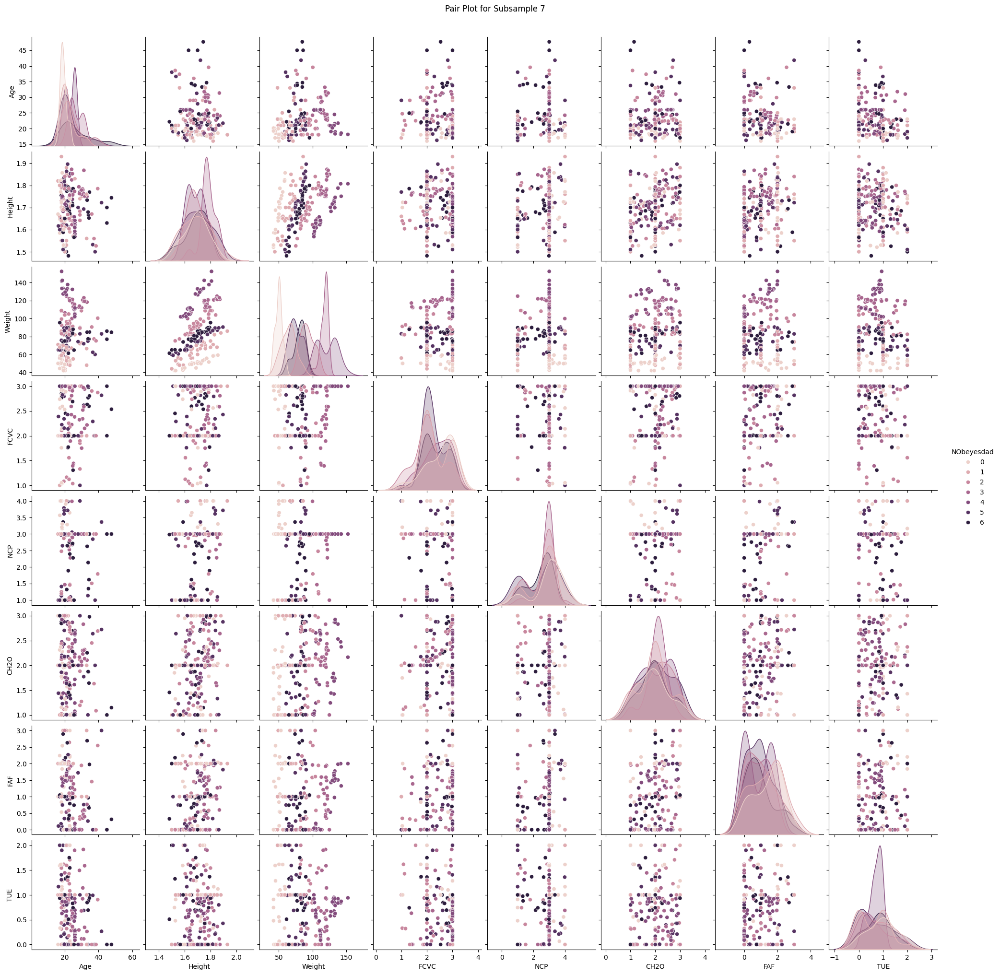

<Figure size 1200x800 with 0 Axes>

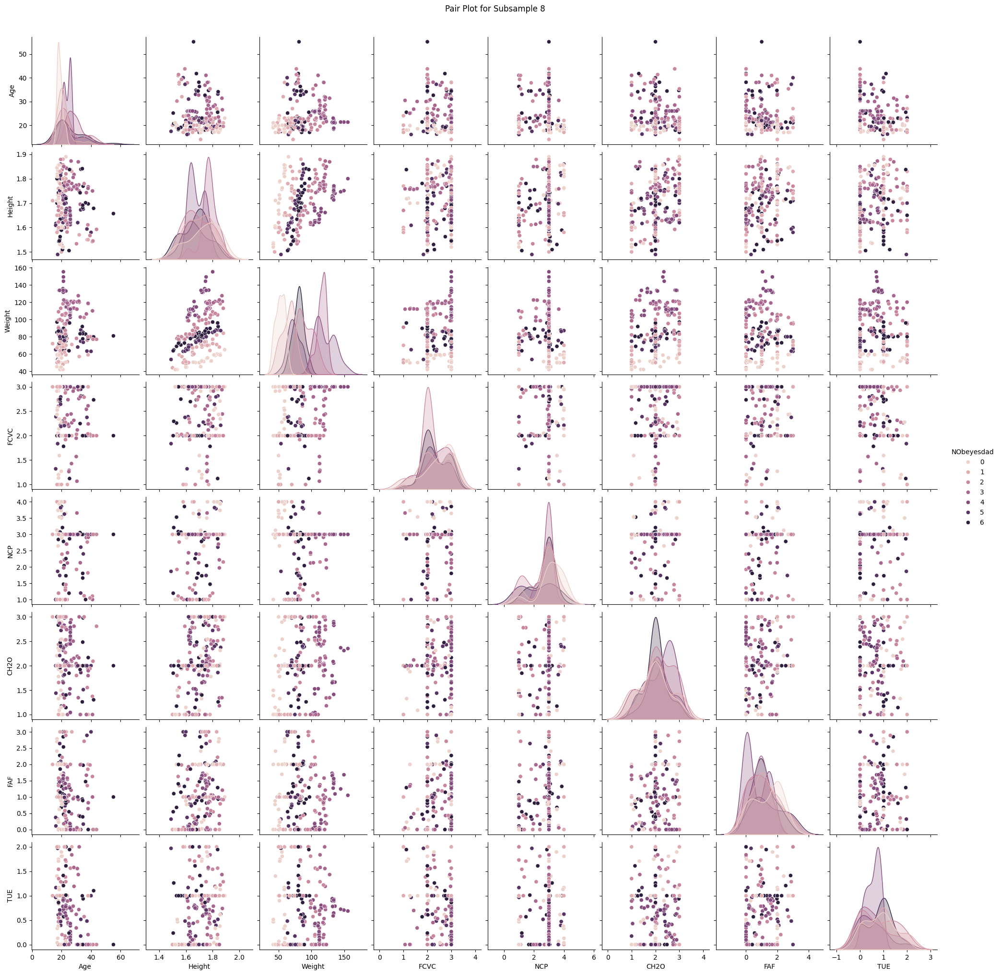

<Figure size 1200x800 with 0 Axes>

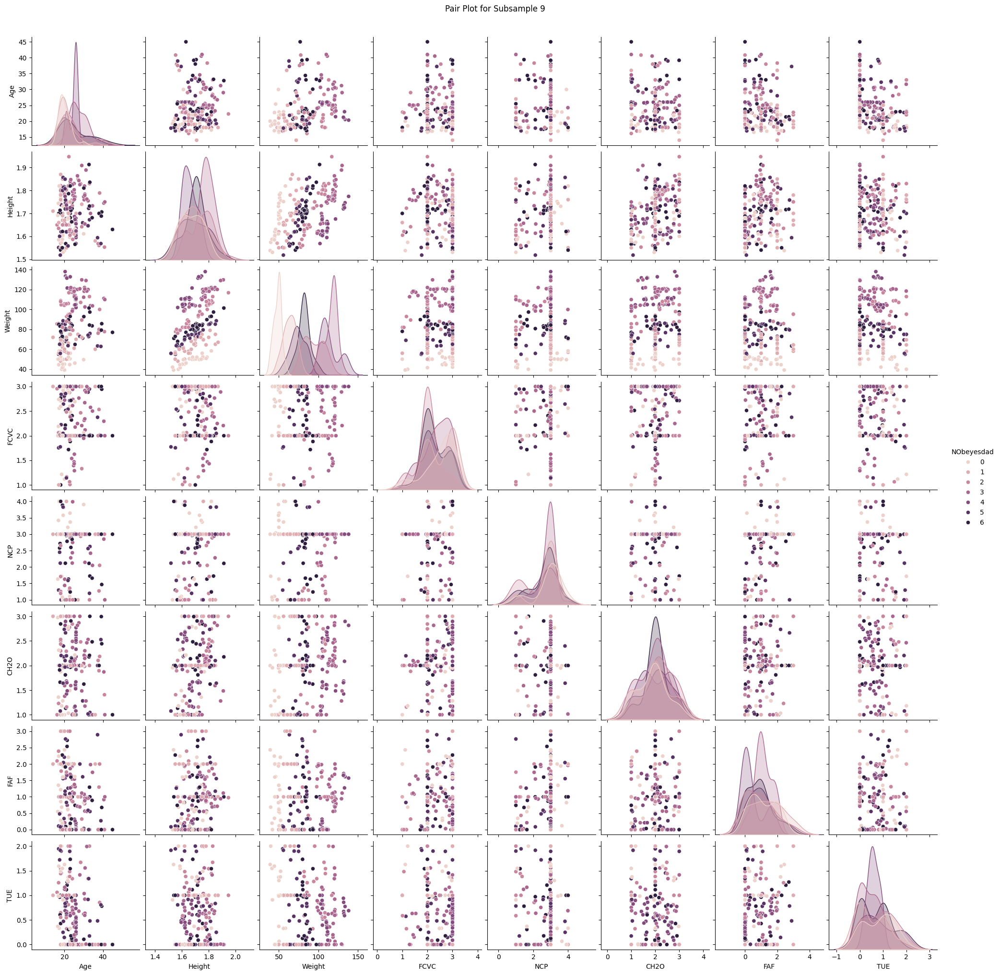

<Figure size 1200x800 with 0 Axes>

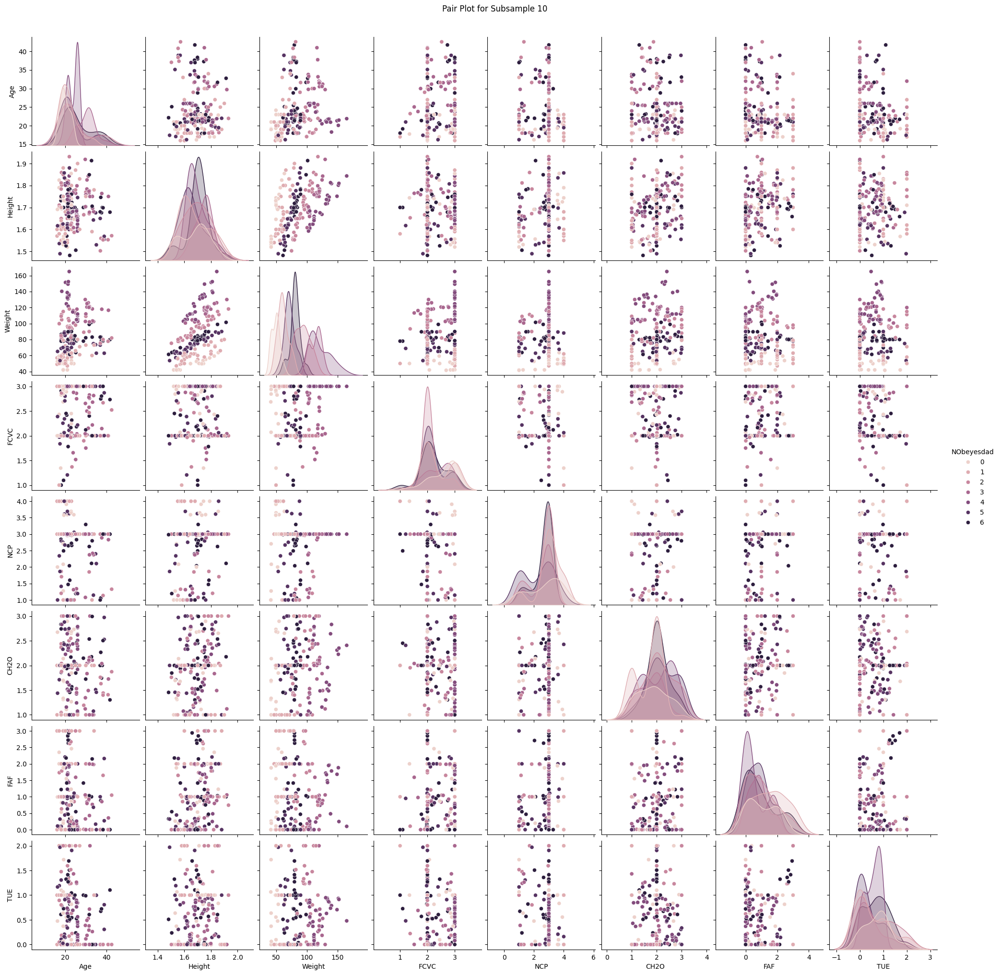

In [27]:
num_subsamples = 10
subsample_size = int(len(df) * 0.1) 

for i in range(num_subsamples):
    subsample = df.sample(n=subsample_size, random_state=i)
    
    subsample_with_target = pd.concat([subsample.drop(columns=['NObeyesdad']), subsample['NObeyesdad']], axis=1)
    
    # Plot pair plot
    plt.figure(figsize=(12, 8))
    sns.pairplot(subsample_with_target, hue='NObeyesdad', diag_kind='kde')
    plt.suptitle(f'Pair Plot for Subsample {i + 1}', y=1.02)
    plt.show()

**TASK: Create a clustermap with seaborn to explore the relationships between variables.**

<Figure size 1200x1000 with 0 Axes>

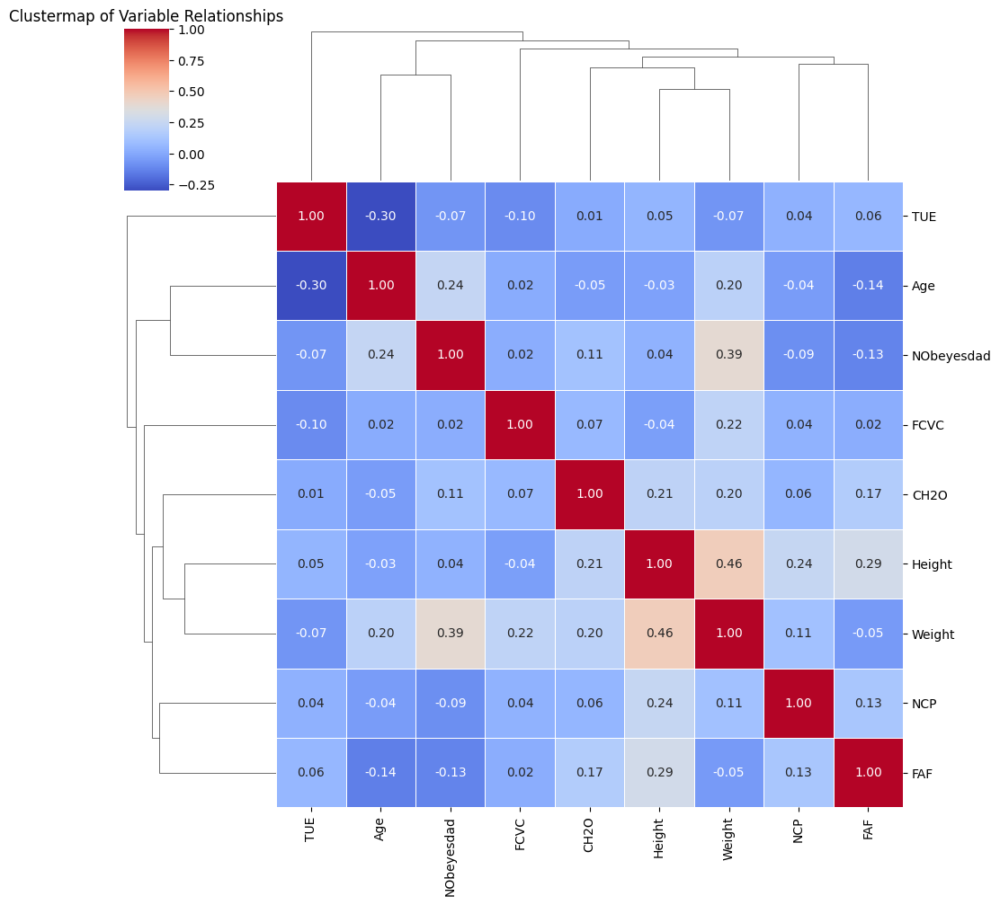

In [28]:
numeric_df = df.select_dtypes(include='number')

correlation_matrix = numeric_df.corr()

plt.figure(figsize=(12, 10))
sns.clustermap(correlation_matrix, cmap='coolwarm', linewidths=0.5, annot=True, fmt=".2f")
plt.title('Clustermap of Variable Relationships')
plt.show()

**TASK: Perform SVM modelling and check the performance of your model, improve the performance of your model using grdisearch**

In [29]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

X = df.drop(columns=['NObeyesdad'])
y = df['NObeyesdad']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

label_encoder = LabelEncoder()
imputer = SimpleImputer(strategy='mean')

X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

for feature in X_train_encoded.select_dtypes(include='object').columns:
    X_train_encoded[feature] = label_encoder.fit_transform(X_train[feature])
    X_test_encoded[feature] = label_encoder.transform(X_test[feature])

X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train_encoded), columns=X_train_encoded.columns)
X_test_imputed = pd.DataFrame(imputer.transform(X_test_encoded), columns=X_test_encoded.columns)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)
X_test_scaled = scaler.transform(X_test_imputed)

svm = SVC()

param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf', 'linear', 'poly']
}

grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)
print("Best Cross-Validation Score:", grid_search.best_score_)

best_svm = SVC(**best_params)
best_svm.fit(X_train_scaled, y_train)

y_pred = best_svm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print("Model Accuracy:", accuracy)
print(classification_report(y_test, y_pred))

Best Parameters: {'C': 100, 'gamma': 1, 'kernel': 'linear'}
Best Cross-Validation Score: 0.9609028497181887
Model Accuracy: 0.9787234042553191
              precision    recall  f1-score   support

           0       0.98      0.96      0.97        56
           1       0.95      0.97      0.96        62
           2       0.99      1.00      0.99        78
           3       1.00      1.00      1.00        58
           4       1.00      1.00      1.00        63
           5       0.96      0.95      0.95        56
           6       0.96      0.96      0.96        50

    accuracy                           0.98       423
   macro avg       0.98      0.98      0.98       423
weighted avg       0.98      0.98      0.98       423

